In [ ]:
#!unzip "/content/drive/MyDrive/dog-breed-identification (1).zip"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF HUB version", hub.__version__)

TF version 2.15.0
TF HUB version 0.16.1


In [ ]:
print("GPU", "availabel(yessss)"if tf.config.list_physical_devices("GPU") else "not available")

GPU availabel(yessss)


## getting our data ready

with all machine learning models our data has to be in the numerical format
 (turning images into numerical representation)

In [ ]:
import pandas as pd
labels = pd.read_csv("/content/labels.csv")
print(labels.describe())
labels.head()


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

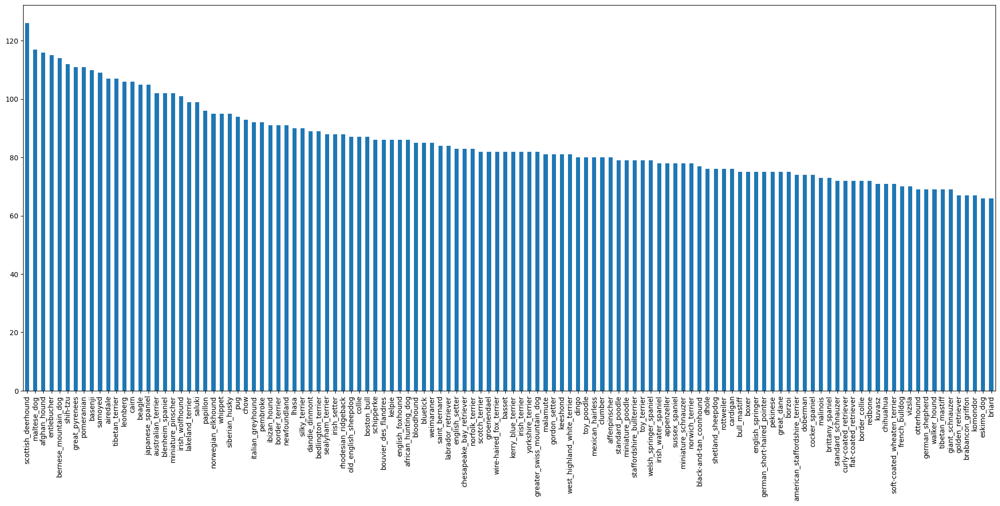

In [ ]:
labels["breed"].value_counts().plot.bar(figsize = (25,10))

In [ ]:
labels["breed"].value_counts().median()

82.0

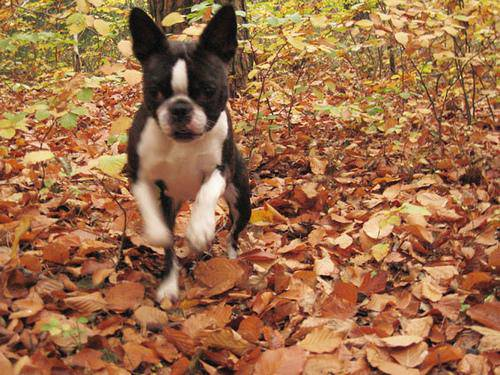

In [ ]:
from IPython.display import Image
Image("/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

###  Getting images and their labels
lets get a list of all our images

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filename = ["/content/train/" + fname + ".jpg" for fname in labels["id"]]
filename[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## check whether number of filenames matches number of images


In [ ]:
import os
if len(os.listdir("/content/train/")) == len(filename):
  print("Filenames matches")
else:
  print("Doesnt matches check the code")


Filenames matches


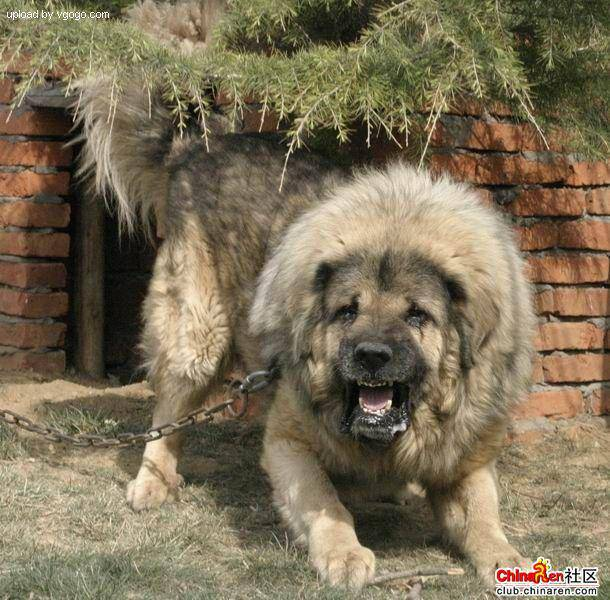

In [ ]:
# one more check
Image(filename[9000])

In [ ]:
labels["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
label1 = labels["breed"].to_numpy()
#label1 = np.array(label1)#does the same thing
label1

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(label1) == len(filename):
  print("correct")
else:
  print("files missing")

correct


In [ ]:
# find the unique label
unique_breed = np.unique(label1)
len(unique_breed)

120

In [ ]:
# turn single label into array
print(label1[0])
label1[0] == unique_breed

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_label = [label == unique_breed for label in label1]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# turning boolean label in integers
print(label1[0])# orignal label
print(np.where(unique_breed == label1[0])) #index where label occurs
print(boolean_label[0].argmax()) #index where label occurs in boolean array
print(boolean_label[0].astype(int))# there will be one where a sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# creating our own validation set
x = filename
y = boolean_label

we are going to start off using 1000 images and increase as we need

In [ ]:
# set number of images to use within

NUM_IMAGES  = 1000 #@param {type:"slider", min:1000, max:10122, step:10}

In [ ]:
import sklearn
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

preprocessing images(tuning images into tensors)

In [ ]:

from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
IMG_SIZE = 224

def process_image(image_path):
  """
  turns an image filepath and change them into tensors
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image in a numerical tensor with three colour channel(red, yellow, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channel from 0 to 255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=(IMG_SIZE, IMG_SIZE))
  return image

turning data into batches

why turn our data into batches?

lets say you are trying to process 10000 images in one go they all might not fit into memory

so thats why we do about 32 images at a time ()you can manually adjust the batch size

in order to use tensor flow effictively we need out data in form of tensor tuple

In [ ]:
# create a simple function that return a tuple(image or label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
#(process_image(x[42]), tf.constant(y[42]))

In [ ]:
# lets make a function to turn all of our data x and y into batches
BATCH_SIZE = 32
# create a function to turn data into batches
def create_data_batch(x, y=None, size=BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image x and label y pair it shuffles the data
  if its traning data but doesnt shuffle if its validation data
  Also accepts test data as input
  """
  # IF the data is the test dataset, we prolly dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))# onlyfile path no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset we dont need to shuffle it
  elif valid_data:
    print("Creating validation batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating training data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
  #shuffuling pathnames and labels before mapping the images procceser function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)

  # turn the training data into batch
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
train_data = create_data_batch(x_train, y_train)
valid_data = create_data_batch(x_val, y_val, valid_data=True)

creating training data
Creating validation batches


In [ ]:
train_data.element_spec, valid_data.element_spec



((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#visualzing data batches

our data is now in batches however these can be a litte hard to understand


In [ ]:
import matplotlib.pyplot as plt

def show_25_images(image, label1):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(unique_breed[label1[i].argmax()])
    plt.axis("off")



In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

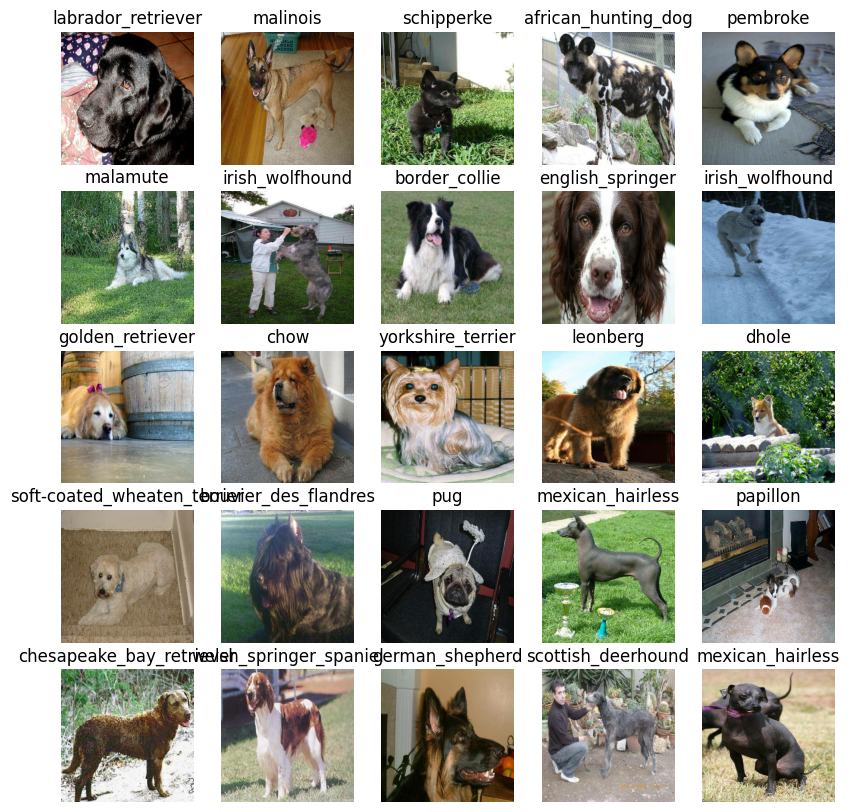

In [ ]:
# everytime you run this new images are shown as we have defined the function to shuffle the images when we run the train data
train_images , train_label = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_label)

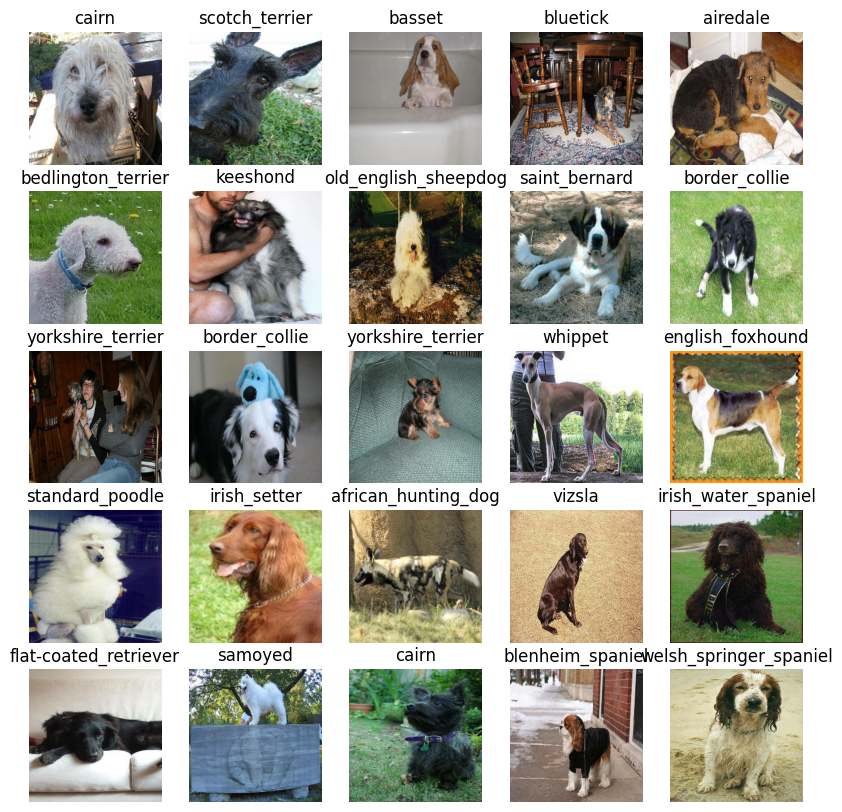

In [ ]:
# validation set
val_images, val_label = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_label)

# building a model
before bulding a model there are a few things that have to defined
* input shape(image shape in form of tensors)to our model
*The output shape(image labels in form of tensors)to our model
* the URL of the model we want to use

In [ ]:
# Setup input shape and output
INPUT_SHAPE = (None, IMG_SIZE, IMG_SIZE, 3)  # batch,height,width,color channel
OUTPUT_SHAPE = len(unique_breed)
# setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

# lets create a fucntion which takes the input shap,output and model
* Takes input output shape that we have chosen as parameters
* defines the kerans in sequential function
* complies the model(says it should be evaluated and improved
* Build the model (tells the model the input shape it will be getting)
* Returns the model

In [ ]:
# create a function which build keras model
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# creating callbacks
callbacks are a helper function a model can use during training to do such things as save its progress checks its progress and stop traning early if a model stops improving

we'll create 2 callback one for tesnor board which helpstrack our model and other for early stopping which helps model from training too long


TensorBoard callback
* to setup a tensor board callback we need to do three things
1. Load the tensor board  notebook extension.
2. create a tensorboard callback which is able to save logs to a directory and pass it our model `fit` function.
3. visualize our models traning logs with tensor board magic function.

In [ ]:

# step 1
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# early stopping callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [ ]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not" )

GPU available


lets create a function which trains the model

* create model using create_model
* setup tensor board callback using tensorboard callback create_tensorboard_callback()
* call the fit fucntion on model on training data val data and epochs to train for num of epochsand callbacks we'd like to use
* return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 13s 175ms/step - loss: 4.4752 - accuracy: 0.1163 - val_loss: 3.4101 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 142ms/step - loss: 1.5684 - accuracy: 0.7150 - val_loss: 2.1764 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 2s 76ms/step - loss: 0.5625 - accuracy: 0.9312 - val_loss: 1.6946 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 2s 66ms/step - loss: 0.2523 - accuracy: 0.9875 - val_loss: 1.5136 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 2s 63ms/step - loss: 0.1464 - accuracy: 0.9987 - val_loss: 1.4218 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 2s 63ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3825 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] -

###Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.



In [ ]:
%tensorboard --logdir /contentdrive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 53ms/step


array([[6.7512109e-04, 1.8448943e-04, 6.7351857e-04, ..., 3.6618687e-04,
        4.6877256e-05, 2.7472267e-04],
       [3.7304848e-04, 7.5432460e-04, 2.7245532e-03, ..., 5.9154967e-04,
        7.5576332e-04, 9.7586097e-05],
       [7.9826923e-06, 4.3741187e-05, 2.2172505e-06, ..., 2.8526823e-05,
        4.6097270e-05, 8.3472568e-04],
       ...,
       [2.5723298e-07, 8.1309763e-06, 2.8477457e-06, ..., 4.3737723e-06,
        2.8607967e-05, 1.0211220e-05],
       [9.2669958e-03, 6.4378692e-05, 1.4069378e-04, ..., 3.0097255e-04,
        2.2593702e-05, 9.4469693e-03],
       [1.1732836e-03, 4.9557816e-04, 3.4679612e-04, ..., 1.3659942e-02,
        3.1990264e-04, 2.8895020e-05]], dtype=float32)

In [ ]:
predictions[0]


array([3.16606392e-03, 2.98748710e-05, 7.40859716e-04, 4.14485665e-04,
       3.68153153e-04, 7.31169494e-05, 5.02272956e-02, 4.53893235e-03,
       2.54157145e-04, 2.26522694e-04, 9.45671275e-03, 2.65823881e-04,
       3.34261073e-04, 3.37168109e-04, 1.86713791e-04, 8.04489755e-05,
       1.13592141e-04, 2.84056097e-01, 3.34317665e-05, 7.50236723e-05,
       1.21240540e-04, 1.44887512e-04, 3.30325856e-04, 2.50723795e-03,
       1.81840689e-04, 2.96163344e-04, 9.16750804e-02, 8.90871161e-05,
       5.93488629e-04, 2.46263662e-04, 3.13943783e-05, 1.94677617e-03,
       1.30244333e-03, 8.84774126e-05, 4.16301773e-04, 4.31510583e-02,
       3.68627625e-05, 1.59450702e-03, 2.30439735e-04, 1.33635273e-04,
       1.62950368e-03, 2.55063555e-04, 2.15189371e-04, 2.37856715e-04,
       2.25486274e-05, 8.53289617e-04, 1.74389425e-05, 1.61754739e-04,
       2.98393803e-04, 1.15146104e-04, 2.12460654e-04, 3.69307745e-05,
       1.96679306e-04, 2.04695985e-04, 2.11570499e-04, 7.93041727e-06,
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breed[np.argmax(predictions[index])]}")

[7.22022241e-06 1.20666109e-05 3.75553645e-05 1.51504892e-05
 1.10908598e-03 1.23506425e-05 1.43878366e-04 4.71006468e-04
 2.37614731e-03 1.56205082e-02 1.46116727e-05 8.04281990e-06
 3.45547742e-04 2.16067280e-03 1.86654870e-04 4.91842744e-04
 1.47241817e-05 1.30975270e-04 1.37180032e-04 1.33894049e-04
 1.25760171e-05 1.59934018e-04 3.96517753e-05 1.21308785e-05
 1.39530264e-02 2.12762297e-05 4.67873324e-05 3.21984699e-05
 1.31307870e-05 1.10275669e-05 1.94809672e-06 9.57649099e-05
 1.55526959e-05 2.05225915e-05 3.46117158e-05 2.28789559e-05
 4.15268914e-05 1.60762691e-04 1.58709445e-05 6.38378188e-02
 1.10771951e-04 2.14174306e-05 6.55070972e-03 2.72587499e-06
 2.51108111e-04 1.06225980e-05 2.00537921e-04 3.27471120e-04
 1.95335888e-05 1.37431969e-04 5.15590364e-06 1.09389053e-04
 5.78754480e-05 8.68791889e-04 8.85808549e-06 2.60805769e-04
 1.42943434e-04 1.57381874e-05 1.34132215e-05 1.02995464e-05
 1.23700911e-05 2.31606042e-04 5.85486134e-07 7.05758503e-05
 2.12858904e-05 2.156814

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

Prediction labels
Validation labels (truth labels)
Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
Convert the prediction probabilities to a predicted label. ✅
Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

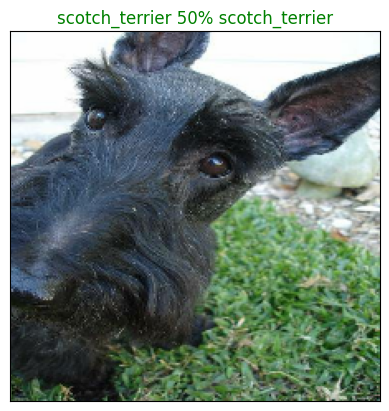

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

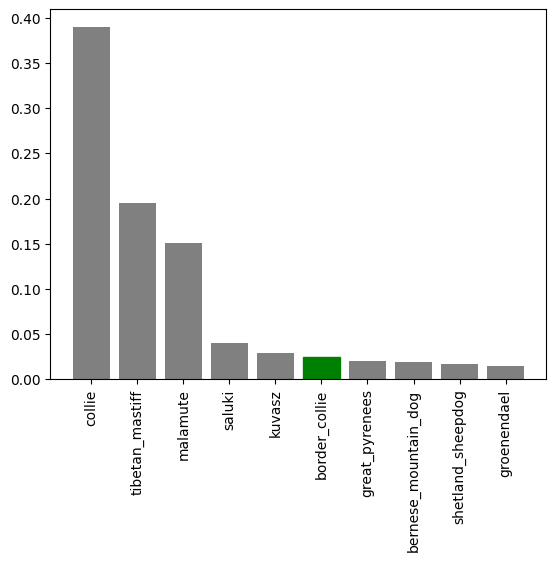

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

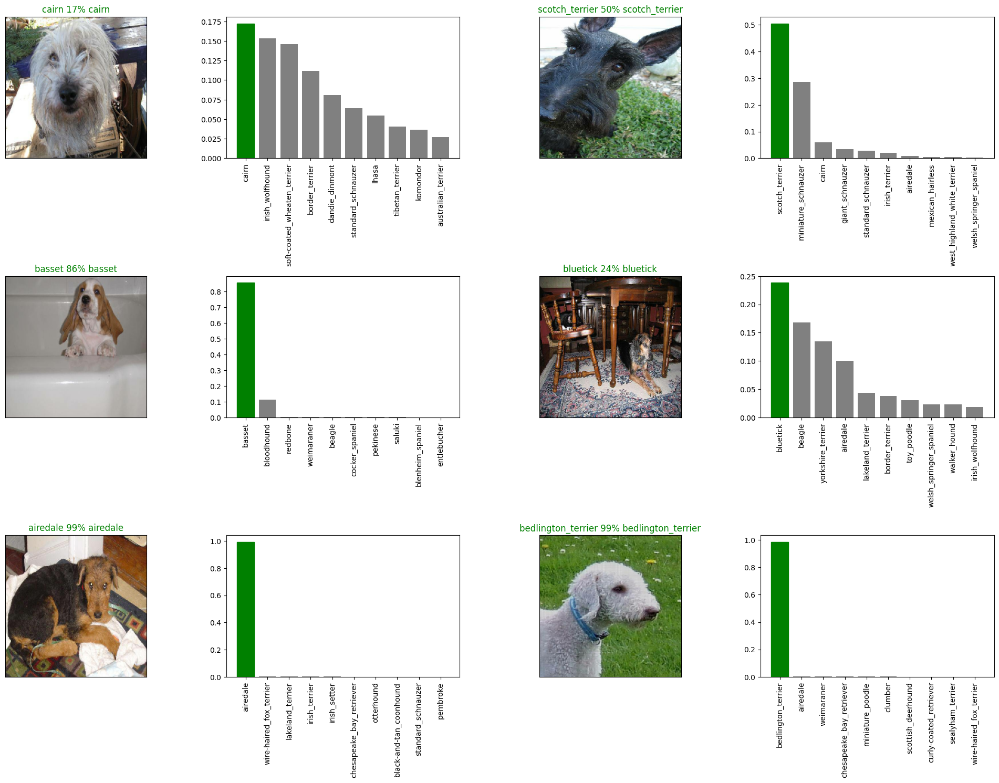

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Saving and reloading a model
After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the tf.keras.models.load_model() function to load it into the notebook.

Because we're using a component from TensorFlow Hub (hub.KerasLayer) we'll have to pass this as a parameter to the custom_objects parameter.



In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20240217-07431708155821-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Vision/models/20240217-07431708155821-1000-images-Adam.h5'

In [ ]:
# load a train model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20240217-07431708155821-1000-images-Adam.h5')


Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240217-07431708155821-1000-images-Adam.h5


In [ ]:
#Evaluate the pre saved model
model.evaluate(valid_data)

7/7 [==============================] - 0s 55ms/step - loss: 1.2235 - accuracy: 0.6850


[1.2235159873962402, 0.6850000023841858]

In [ ]:
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 49ms/step - loss: 1.2235 - accuracy: 0.6850


[1.2235159873962402, 0.6850000023841858]

In [ ]:
len(x), len(y)

In [ ]:
full_data = create_data_batch(x, y)

In [ ]:
full_data

In [ ]:
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping]

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")


In [ ]:
loaded_full_model = load_model()

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

#preparing test submission for kaggle

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:

# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)